In [1]:
# ETS Model with Store Location and Holiday Flag, Validated on Test Set
import pandas as pd
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt

# Load data
train = pd.read_csv('./store/train.csv', parse_dates=['date'])
stores = pd.read_csv('./store/stores.csv')
holidays = pd.read_csv('./store/holidays_events.csv', parse_dates=['date'])
test = pd.read_csv('./store/test.csv', parse_dates=['date'])

# Merge store location into train and test
train = train.merge(stores, on='store_nbr', how='left')
test = test.merge(stores, on='store_nbr', how='left')

# Efficient vectorized holiday flag assignment

# Prepare holiday DataFrames for each locale type
hol_nat = holidays[holidays['locale'] == 'National'][['date']].copy()
hol_nat['is_holiday_nat'] = 1
hol_reg = holidays[holidays['locale'] == 'Regional'][['date', 'locale_name']].copy()
hol_reg['is_holiday_reg'] = 1
hol_loc = holidays[holidays['locale'] == 'Local'][['date', 'locale_name']].copy()
hol_loc['is_holiday_loc'] = 1

# Merge national holidays
train = train.merge(hol_nat, on='date', how='left')
# Merge regional holidays
train = train.merge(hol_reg, left_on=['date', 'state'], right_on=['date', 'locale_name'], how='left')
# Merge local holidays
train = train.merge(hol_loc, left_on=['date', 'city'], right_on=['date', 'locale_name'], how='left')

# Combine all holiday flags
train['is_holiday'] = (
    train['is_holiday_nat'].fillna(0) +
    train['is_holiday_reg'].fillna(0) +
    train['is_holiday_loc'].fillna(0)
) > 0
train['is_holiday'] = train['is_holiday'].astype(int)

# Drop helper columns
train = train.drop(columns=['is_holiday_nat', 'is_holiday_reg', 'is_holiday_loc', 'locale_name_x', 'locale_name_y'], errors='ignore')

# Repeat for test set
test = test.merge(hol_nat, on='date', how='left')
test = test.merge(hol_reg, left_on=['date', 'state'], right_on=['date', 'locale_name'], how='left')
test = test.merge(hol_loc, left_on=['date', 'city'], right_on=['date', 'locale_name'], how='left')
test['is_holiday'] = (
    test['is_holiday_nat'].fillna(0) +
    test['is_holiday_reg'].fillna(0) +
    test['is_holiday_loc'].fillna(0)
) > 0
test['is_holiday'] = test['is_holiday'].astype(int)
test = test.drop(columns=['is_holiday_nat', 'is_holiday_reg', 'is_holiday_loc', 'locale_name_x', 'locale_name_y'], errors='ignore')


# train['is_holiday'] = train.apply(is_holiday, axis=1)
# test['is_holiday'] = test.apply(is_holiday, axis=1)

# For demonstration, aggregate sales by date (all stores/items) and use holiday flag (if any store is on holiday that day)
daily_sales = train.groupby(['date', 'store_nbr', 'family']).agg({'sales':'sum', 'is_holiday':'max'})
test_daily = test.groupby(['date', 'store_nbr', 'family']).agg({'is_holiday':'max'})

In [2]:
daily_sales = daily_sales.reset_index()[['date', 'store_nbr', 'family', 'sales']]
# Create a DataFrame with daily_sales date and sales columns
daily_sales_df = daily_sales.reset_index()[['date', 'sales']]
test_daily_sales_df = test_daily.reset_index()[['date']]

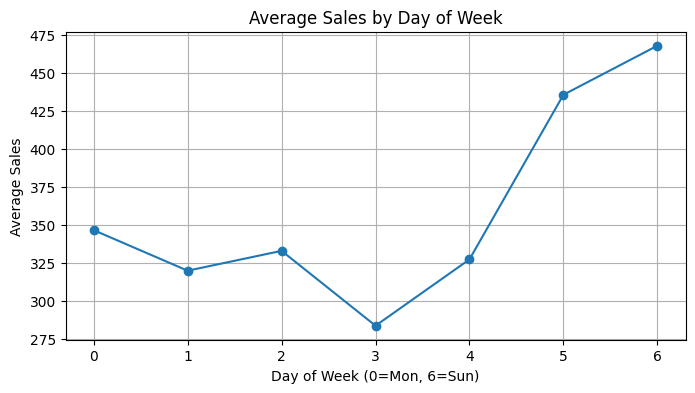

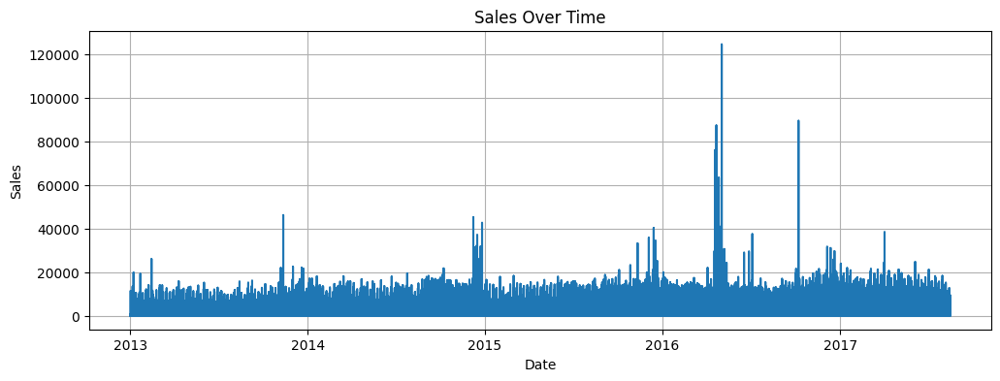

If the seasonal pattern (e.g., weekly swings) stays about the same size as sales increase, seasonality is likely additive.
If the swings get larger as sales increase, seasonality is likely multiplicative.


In [ ]:
# Visualize seasonality in the training data to assess if it is additive or multiplicative
import matplotlib.pyplot as plt
import numpy as np

# Assume daily_sales_df['date'] is datetime and 'sales' is the value
# Extract day of week and plot average sales by day of week
train_df = daily_sales_df.copy()
train_df['dayofweek'] = train_df['date'].dt.dayofweek
avg_sales_by_dow = train_df.groupby('dayofweek')['sales'].mean()

plt.figure(figsize=(8,4))
plt.plot(avg_sales_by_dow, marker='o')
plt.title('Average Sales by Day of Week')
plt.xlabel('Day of Week (0=Mon, 6=Sun)')
plt.ylabel('Average Sales')
plt.grid(True)
plt.show()

# Plot sales vs. time to see if seasonal swings grow with level
plt.figure(figsize=(12,4))
plt.plot(train_df['date'], train_df['sales'])
plt.title('Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Sales')
plt.grid(True)
plt.show()

# Guidance:
print("If the seasonal pattern (e.g., weekly swings) stays about the same size as sales increase, seasonality is likely additive.\nIf the swings get larger as sales increase, seasonality is likely multiplicative.")

In [5]:
# Per-store_nbr and family ARIMA(1,1,1) 80/20 split and metrics
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Ensure daily_sales_df has store_nbr and family columns
if not all(col in train.columns for col in ['store_nbr', 'family']):
    raise ValueError('daily_sales_df must have store_nbr and family columns for this analysis.')


# Get unique store-family combinations
store_family_combos = test[['store_nbr', 'family']].drop_duplicates()

# Store predictions for submission
submission_rows = []

for _, row in store_family_combos.iterrows():
    store, family = row['store_nbr'], row['family']
    
    ts_train = train[(train['store_nbr'] == store) & (train['family'] == family)].sort_values('date')
    ts_test = test[(test['store_nbr'] == store) & (test['family'] == family)].sort_values('date')
    
    try:
        ets = ETSModel(ts_train['sales'], error='add', trend='add', seasonal='add', damped_trend=True, seasonal_periods=7)
        ets_fit = ets.fit()
        ets_forecast = ets_fit.get_prediction(start=ts_test.index[0], end=ts_test.index[-1]).predicted_mean
        # Append (id, forecast) pairs
        submission_rows.extend(zip(ts_test['id'], ets_forecast))
    except Exception as e:
        print(f'ETS failed for store {store}, family {family}: {e}')

results_df = pd.DataFrame(submission_rows)


C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Predic

KeyboardInterrupt: 

In [ ]:
submission_df = pd.DataFrame(submission_rows, columns=['id', 'sales'])
submission_df = submission_df.sort_values('id')
submission_df.to_csv('./store/submission_ets.csv', index=False)
print("Submission saved to './store/submission_ets.csv'")

Submission saved to 'submission_ets.csv'


In [ ]:
# Per-store_nbr and family ARIMA(1,1,1) 80/20 split and metrics
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Ensure daily_sales_df has store_nbr and family columns
if not all(col in train.columns for col in ['store_nbr', 'family']):
    raise ValueError('daily_sales_df must have store_nbr and family columns for this analysis.')


# Get unique store-family combinations
store_family_combos = test[['store_nbr', 'family']].drop_duplicates()

# Store predictions for submission
submission_rows = []

for _, row in store_family_combos.iterrows():
    store, family = row['store_nbr'], row['family']
    
    ts_train = train[(train['store_nbr'] == store) & (train['family'] == family)].sort_values('date')
    ts_test = test[(test['store_nbr'] == store) & (test['family'] == family)].sort_values('date')
    
    try:
        arima = ARIMA(ts_train['sales'], order=(1,1,1))
        arima_fit = arima.fit()
        forecast = arima_fit.forecast(steps=len(ts_test))
        # Append (id, forecast) pairs
        submission_rows.extend(zip(ts_test['id'], forecast))
    except Exception as e:
        print(f'ARIMA failed for store {store}, family {family}: {e}')

results_df = pd.DataFrame(submission_rows)


C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_mode

         0         1
0  3000888  4.445781
1  3002670  4.447761
2  3004452  4.447770
3  3006234  4.447770
4  3008016  4.447770


C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
submission_df = pd.DataFrame(submission_rows, columns=['id', 'sales'])
submission_df = submission_df.sort_values('id')
submission_df.to_csv('./store/submission_ets.csv', index=False)
print("Submission saved to 'submission_ets.csv'")

Submission saved to 'submission_arima.csv'


ETS Model (Error-Trend-Seasonality)
How it works: ETS models decompose a time series into error, trend, and seasonality components. You used both additive and multiplicative forms, which allow the model to adapt to different types of seasonal and trend patterns.
Strengths:
Captures trend and seasonality explicitly.
Good for data with clear, regular seasonal patterns and trends.
Simple to interpret: you can see the contribution of each component.
Limitations:
Assumes patterns are consistent over time.
May not handle sudden shocks or irregularities as well as ARIMA.
ARIMA Model (AutoRegressive Integrated Moving Average)
How it works: ARIMA models use past values and past errors to predict future values. The (1,1,1) order means:
1 lag for autoregression,
1 difference to make the series stationary,
1 lag for moving average.
Strengths:
Flexible for a wide range of time series, especially those without strong seasonality.
Can handle non-stationary data via differencing.
Limitations:
Does not model seasonality directly (unless using SARIMA).
Can be harder to interpret, as it’s based on lagged values and errors.
Model Comparison
ETS is generally better when your data has strong, regular seasonality and trend, as it models these directly.
ARIMA is more flexible for non-seasonal or less regular data, and can be extended to SARIMA for seasonal data.
Validation Metrics: In your notebook, you calculated MSE, RMSE, MAE, MAPE, ME, and MPE for both models. Compare these metrics:
Lower values indicate better predictive performance.
If ETS has lower errors, it’s likely capturing the seasonality/trend well.
If ARIMA is better, your data may not have strong or regular seasonality, or ARIMA is better at capturing the autocorrelation structure.
Practical Guidance
If ETS outperforms ARIMA: Your data’s trend and seasonality are strong and regular.
If ARIMA outperforms ETS: Your data may be more irregular, or ARIMA is better at capturing short-term dependencies.
If both are similar: Both models are reasonable; consider model simplicity, interpretability, and computational efficiency.
Summary:

Use ETS for interpretable, seasonal, and trending data.
Use ARIMA for flexible, non-seasonal, or more complex autocorrelation structures.
Always compare validation metrics to choose the best model for your specific dataset.

In [18]:
# Compare ETS and ARIMA: 80/20 split per store-family, average RMSE and MAE
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error
import numpy as np

store_family_combos = train[['store_nbr', 'family']].drop_duplicates()

ets_rmse_list, ets_mae_list = [], []
arima_rmse_list, arima_mae_list = [], []

for _, row in store_family_combos.iterrows():
    store, family = row['store_nbr'], row['family']
    ts = train[(train['store_nbr'] == store) & (train['family'] == family)].sort_values('date')
    if len(ts) < 10:
        continue  # skip very short series
    split_idx = int(len(ts) * 0.8)
    train_part, valid_part = ts.iloc[:split_idx], ts.iloc[split_idx:]
    # ETS
    try:
        ets = ExponentialSmoothing(train_part['sales'], trend='add', seasonal='add', seasonal_periods=7, damped_trend=True)
        ets_fit = ets.fit(optimized=True)
        ets_pred = ets_fit.forecast(len(valid_part))
        ets_rmse = root_mean_squared_error(valid_part['sales'], ets_pred)
        ets_mae = mean_absolute_error(valid_part['sales'], ets_pred)
        ets_rmse_list.append(ets_rmse)
        ets_mae_list.append(ets_mae)
        ets_mae
    except Exception as e:
        print(e)
        pass
    # ARIMA
    try:
        arima = ARIMA(train_part['sales'], order=(1,1,1))
        arima_fit = arima.fit()
        arima_pred = arima_fit.forecast(steps=len(valid_part))
        arima_rmse = root_mean_squared_error(valid_part['sales'], arima_pred)
        arima_mae = mean_absolute_error(valid_part['sales'], arima_pred)
        arima_rmse_list.append(arima_rmse)
        arima_mae_list.append(arima_mae)
    except Exception as e:
        pass


print(f"ETS average RMSE: {np.mean(ets_rmse_list):.2f}, average MAE: {np.mean(ets_mae_list):.2f}")
print(f"ARIMA average RMSE: {np.mean(arima_rmse_list):.2f}, average MAE: {np.mean(arima_mae_list):.2f}")

C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a

ETS average RMSE: 187.74, average MAE: 129.97
ARIMA average RMSE: 184.91, average MAE: 127.22


C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:837: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
C:\Users\anujb\AppData\Roaming\Python\Python313\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided. As a